# Negativos de Imagens.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

In [2]:
# Primeiro canal R, Segundo canal G, Terceiro canal B
img_plt = plt.imread('gato.jpeg')
print(img_plt.shape)

(667, 1200, 3)


In [3]:
img_cv = cv2.imread('mama.jpeg', cv2.IMREAD_GRAYSCALE)
print(img_cv.shape)

# Primeiro canal B, Segundo canal G, Terceiro canal R
img_cv_2 = cv2.imread('gato.jpeg')
print(img_cv_2.shape)

(571, 482)
(667, 1200, 3)


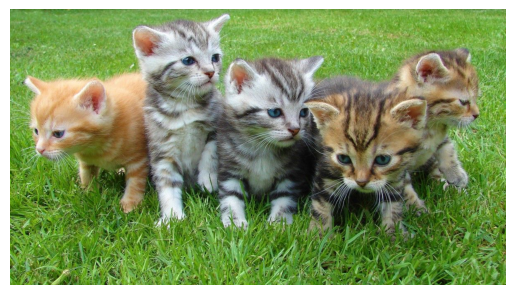

In [4]:
plt.imshow(img_plt)
plt.axis('off')
plt.show()

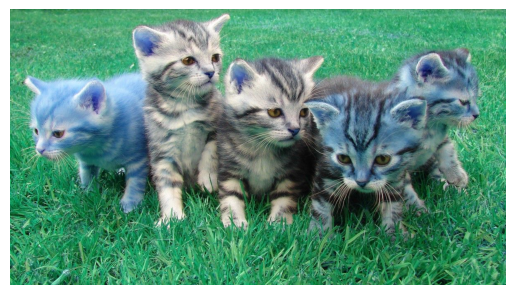

In [5]:
plt.imshow(img_cv_2)
plt.axis('off')
plt.show()

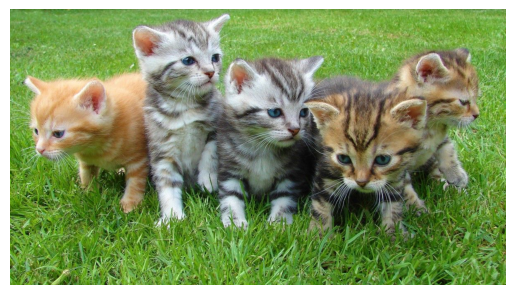

In [6]:
img_true = cv2.cvtColor(img_cv_2, cv2.COLOR_BGR2RGB)
# Display the grayscale image
plt.imshow(img_true)
plt.axis('off')
plt.show()

In [7]:
# Exibir a imagem usando matplotlib, canal B, G, R
img = plt.imread('mama.jpeg')

#Convert to negative
# Note: A imagem de Saida sera 255 - r (valor do pixel original)
img_negative = 255 - img

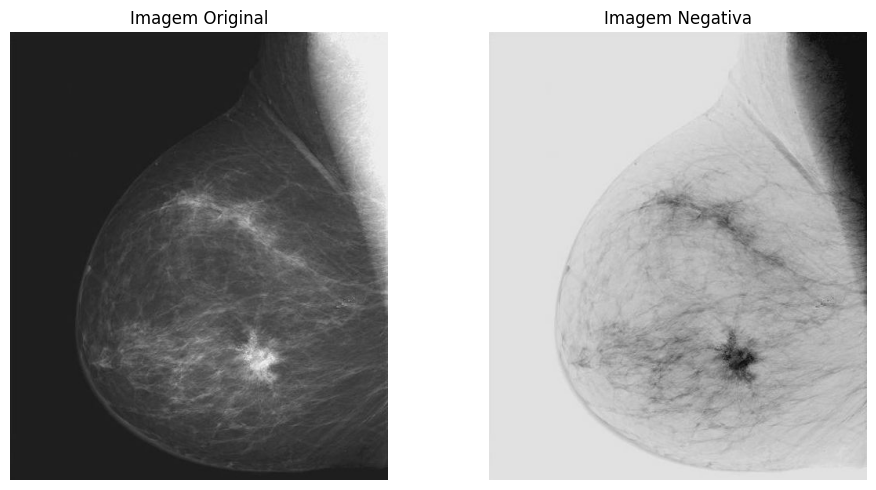

In [8]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(img, cmap='gray')
ax[0].set_title('Imagem Original')
ax[0].axis('off')   
ax[1].imshow(img_negative, cmap='gray')
ax[1].set_title('Imagem Negativa')
ax[1].axis('off')
plt.tight_layout()
plt.show()  

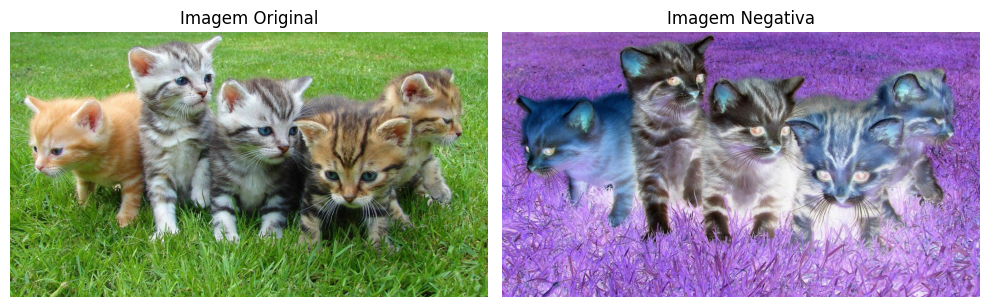

In [9]:
#negativo de imagem colorida
img_color_negative = 255 - img_plt
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(img_plt)
ax[0].set_title('Imagem Original')
ax[0].axis('off')
ax[1].imshow(img_color_negative)
ax[1].set_title('Imagem Negativa')
ax[1].axis('off')
plt.tight_layout()
plt.show()  

# Ajuste de Brilho

In [10]:
#funcao de ajuste de brilho
def adjust_brightness(image, brightness_factor):
    image = np.astype(image, np.float32)  # Convert to float for precision
    image = image + brightness_factor
    image[image > 255] = 255  # Cap values at 255
    image[image < 0] = 0  # Cap values at 0
    return np.astype(image, np.uint8)  # Convert back to uint8

In [11]:
img_brightness = adjust_brightness(img, 80)
img_brightless = adjust_brightness(img, -80)

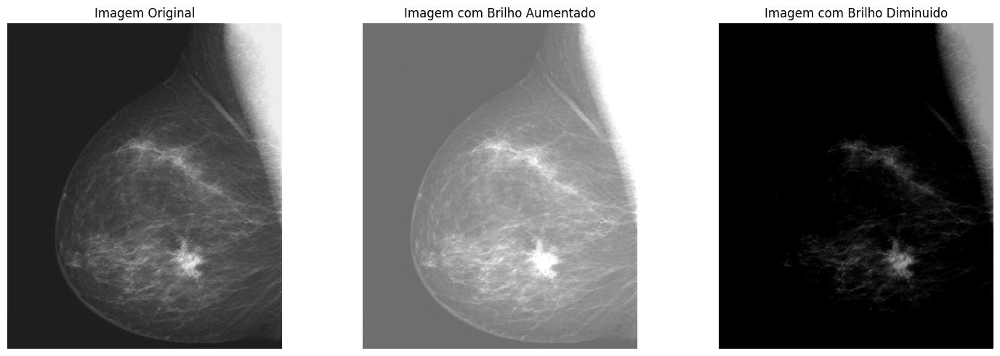

In [12]:
# Alterando o brilho da imagem
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(img)
ax[0].set_title('Imagem Original')
ax[0].axis('off') 
ax[1].imshow(img_brightness)
ax[1].set_title('Imagem com Brilho Aumentado')    
ax[1].axis('off')
ax[2].imshow(img_brightless)
ax[2].set_title('Imagem com Brilho Diminuido')
ax[2].axis('off')
plt.tight_layout()
plt.show()  

# Ajuste de brilho de imagens coloridas RGB

In [13]:
img_brightness = adjust_brightness(img_plt, 80)
img_brightless = adjust_brightness(img_plt, -80)

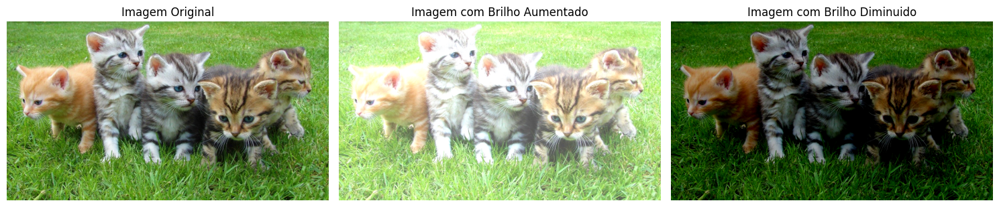

In [14]:
# Alterando o brilho da imagem
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(img_plt)
ax[0].set_title('Imagem Original')
ax[0].axis('off') 
ax[1].imshow(img_brightness)
ax[1].set_title('Imagem com Brilho Aumentado')    
ax[1].axis('off')
ax[2].imshow(img_brightless)
ax[2].set_title('Imagem com Brilho Diminuido')
ax[2].axis('off')
plt.tight_layout()
plt.show()  

In [15]:
# Funçao que ajusta o brilho por multiplicação
def adjust_brightness_multiply(image, brightness_factor):
    image = np.astype(image, np.float32)  # Convert to float for precision
    image = image * brightness_factor
    image[image > 255] = 255  # Cap values at 255
    image[image < 0] = 0  # Cap values at 0
    return np.astype(image, np.uint8)  # Convert back to uint8

In [16]:
img_brightness2 = adjust_brightness_multiply(img_plt, 1.5)
img_brightless2 = adjust_brightness_multiply(img_plt, 0.4)

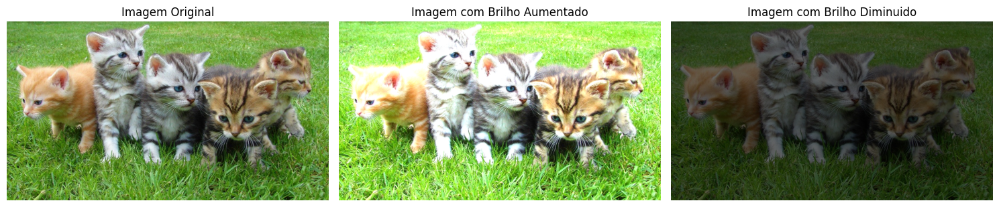

In [17]:
# Display the image
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(img_plt)
ax[0].set_title('Imagem Original')
ax[0].axis('off')   
ax[1].imshow(img_brightness2)
ax[1].set_title('Imagem com Brilho Aumentado')
ax[1].axis('off')
ax[2].imshow(img_brightless2)    
ax[2].set_title('Imagem com Brilho Diminuido')
ax[2].axis('off')
plt.tight_layout()
plt.show()

# Modelo HSI

In [ ]:
def rgb_to_hsi(image):
    # Normalizar RGB para [0, 1]
    rgb = image.astype(np.float32) / 255.0
    r, g, b = rgb[:, :, 0], rgb[:, :, 1], rgb[:, :, 2]
    
    # Calcular intensidade (I)
    intensity = (r + g + b) / 3.0
    
    # Calcular saturação (S)
    min_rgb = np.minimum(np.minimum(r, g), b)
    saturation = np.where(intensity == 0, 0, 1 - min_rgb / intensity)
    
    # Calcular matiz (H)
    numerator = 0.5 * ((r - g) + (r - b))
    denominator = np.sqrt((r - g)**2 + (r - b) * (g - b))
    
    # Evitar divisão por zero
    theta = np.where(denominator == 0, 0, np.arccos(np.clip(numerator / denominator, -1, 1)))
    
    # Converter para graus
    hue = np.where(b <= g, theta, 2 * np.pi - theta)
    hue = np.degrees(hue)
    
    # Criar imagem HSI
    hsi_image = np.stack([hue, saturation, intensity], axis=-1)
    
    return hsi_image

def hsi_to_rgb(hsi_image):
    h, s, i = hsi_image[:, :, 0], hsi_image[:, :, 1], hsi_image[:, :, 2]
    
    # Converter H para radianos
    h_rad = np.radians(h)
    
    # Inicializar canais RGB
    r = np.zeros_like(h)
    g = np.zeros_like(h)
    b = np.zeros_like(h)
    
    # Setor RG (0° <= H < 120°)
    mask1 = (h >= 0) & (h < 120)
    if np.any(mask1):
        b[mask1] = i[mask1] * (1 - s[mask1])
        r[mask1] = i[mask1] * (1 + s[mask1] * np.cos(h_rad[mask1]) / np.cos(np.radians(60) - h_rad[mask1]))
        g[mask1] = 3 * i[mask1] - (r[mask1] + b[mask1])
    
    # Setor GB (120° <= H < 240°)
    mask2 = (h >= 120) & (h < 240)
    if np.any(mask2):
        h_shifted = h_rad[mask2] - np.radians(120)
        r[mask2] = i[mask2] * (1 - s[mask2])
        g[mask2] = i[mask2] * (1 + s[mask2] * np.cos(h_shifted) / np.cos(np.radians(60) - h_shifted))
        b[mask2] = 3 * i[mask2] - (r[mask2] + g[mask2])
    
    # Setor BR (240° <= H < 360°)
    mask3 = (h >= 240) & (h < 360)
    if np.any(mask3):
        h_shifted = h_rad[mask3] - np.radians(240)
        g[mask3] = i[mask3] * (1 - s[mask3])
        b[mask3] = i[mask3] * (1 + s[mask3] * np.cos(h_shifted) / np.cos(np.radians(60) - h_shifted))
        r[mask3] = 3 * i[mask3] - (g[mask3] + b[mask3])
    
    # Combinar canais e converter para RGB (0-255)
    rgb_image = np.stack([r, g, b], axis=-1)
    rgb_image = np.clip(rgb_image * 255, 0, 255).astype(np.uint8)
    
    return rgb_image

def adjust_brightness_hsi(image, brightness_factor):
    # Converter RGB para HSI
    hsi_image = rgb_to_hsi(image)
    
    # Ajustar apenas o canal de intensidade (I)
    hsi_image[:, :, 2] = np.clip(hsi_image[:, :, 2] * brightness_factor, 0, 1)
    
    # Converter de volta para RGB
    adjusted_image = hsi_to_rgb(hsi_image)
    
    return adjusted_image

# Teste das funções com a imagem carregada
print("Funções RGB ↔ HSI implementadas com sucesso!")
print("Funções disponíveis:")
print("- rgb_to_hsi(image): Converte RGB para HSI")
print("- hsi_to_rgb(hsi_image): Converte HSI para RGB") 
print("- adjust_brightness_hsi(image, brightness_factor): Ajusta brilho usando HSI")



Funções RGB ↔ HSI implementadas com sucesso!
Funções disponíveis:
- rgb_to_hsi(image): Converte RGB para HSI
- hsi_to_rgb(hsi_image): Converte HSI para RGB
- adjust_brightness_hsi(image, brightness_factor): Ajusta brilho usando HSI


In [19]:
# Exemplo prático: Ajuste de brilho usando HSI
# Carregar uma imagem para teste
img_test = img_plt.copy()  # Usando a imagem já carregada

# Aplicar diferentes fatores de brilho usando HSI
img_bright_hsi = adjust_brightness_hsi(img_test, 1.5)  # Aumentar brilho
img_dark_hsi = adjust_brightness_hsi(img_test, 0.6)    # Diminuir brilho

# Comparar com o método tradicional (soma/multiplicação direta no RGB)
img_bright_rgb = adjust_brightness_multiply(img_test, 1.5)
img_dark_rgb = adjust_brightness_multiply(img_test, 0.6)

print(f"Imagem original shape: {img_test.shape}")
print(f"Tipo de dados: {img_test.dtype}")
print("Ajustes de brilho aplicados usando HSI e RGB!")

/tmp/ipykernel_68452/1124333671.py:13: RuntimeWarning: invalid value encountered in divide
  saturation = np.where(intensity == 0, 0, 1 - min_rgb / intensity)
/tmp/ipykernel_68452/1124333671.py:20: RuntimeWarning: invalid value encountered in divide
  theta = np.where(denominator == 0, 0, np.arccos(np.clip(numerator / denominator, -1, 1)))


Imagem original shape: (667, 1200, 3)
Tipo de dados: uint8
Ajustes de brilho aplicados usando HSI e RGB!


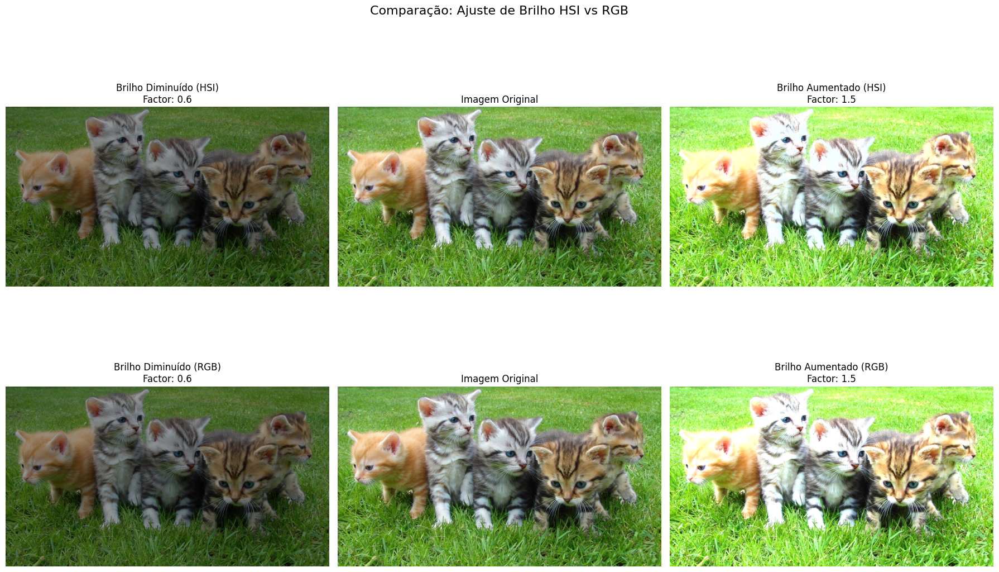

In [20]:
# Visualização comparativa: HSI vs RGB para ajuste de brilho
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Linha superior: Método HSI
axes[0, 0].imshow(img_dark_hsi)
axes[0, 0].set_title('Brilho Diminuído (HSI)\nFactor: 0.6', fontsize=12)
axes[0, 0].axis('off')

axes[0, 1].imshow(img_test)
axes[0, 1].set_title('Imagem Original', fontsize=12)
axes[0, 1].axis('off')

axes[0, 2].imshow(img_bright_hsi)
axes[0, 2].set_title('Brilho Aumentado (HSI)\nFactor: 1.5', fontsize=12)
axes[0, 2].axis('off')

# Linha inferior: Método RGB tradicional
axes[1, 0].imshow(img_dark_rgb)
axes[1, 0].set_title('Brilho Diminuído (RGB)\nFactor: 0.6', fontsize=12)
axes[1, 0].axis('off')

axes[1, 1].imshow(img_test)
axes[1, 1].set_title('Imagem Original', fontsize=12)
axes[1, 1].axis('off')

axes[1, 2].imshow(img_bright_rgb)
axes[1, 2].set_title('Brilho Aumentado (RGB)\nFactor: 1.5', fontsize=12)
axes[1, 2].axis('off')

plt.suptitle('Comparação: Ajuste de Brilho HSI vs RGB', fontsize=16, y=0.98)
plt.tight_layout()
plt.show()

/tmp/ipykernel_68452/1124333671.py:13: RuntimeWarning: invalid value encountered in divide
  saturation = np.where(intensity == 0, 0, 1 - min_rgb / intensity)
/tmp/ipykernel_68452/1124333671.py:20: RuntimeWarning: invalid value encountered in divide
  theta = np.where(denominator == 0, 0, np.arccos(np.clip(numerator / denominator, -1, 1)))


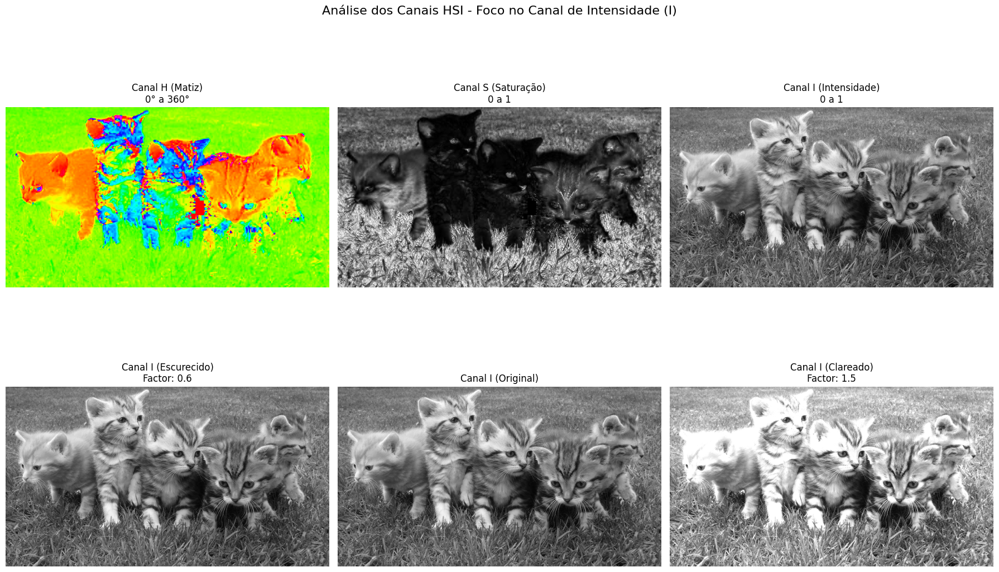

\nEstatísticas dos canais HSI:
Hue (H): min=0.00°, max=359.38°, média=94.87°
Saturation (S): min=-0.000, max=1.000, média=0.342
Intensity (I): min=0.000, max=1.000, média=0.440


In [21]:
# Análise dos canais HSI separadamente
hsi_original = rgb_to_hsi(img_test)

# Extrair canais individuais
hue = hsi_original[:, :, 0]
saturation = hsi_original[:, :, 1] 
intensity = hsi_original[:, :, 2]

# Visualizar canais HSI
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Linha superior: Canais HSI originais
axes[0, 0].imshow(hue, cmap='hsv')
axes[0, 0].set_title('Canal H (Matiz)\n0° a 360°', fontsize=12)
axes[0, 0].axis('off')

axes[0, 1].imshow(saturation, cmap='gray')
axes[0, 1].set_title('Canal S (Saturação)\n0 a 1', fontsize=12)
axes[0, 1].axis('off')

axes[0, 2].imshow(intensity, cmap='gray')
axes[0, 2].set_title('Canal I (Intensidade)\n0 a 1', fontsize=12)
axes[0, 2].axis('off')

# Linha inferior: Demonstração de ajustes no canal I
intensity_bright = np.clip(intensity * 1.5, 0, 1)
intensity_dark = np.clip(intensity * 0.6, 0, 1)

axes[1, 0].imshow(intensity_dark, cmap='gray')
axes[1, 0].set_title('Canal I (Escurecido)\nFactor: 0.6', fontsize=12)
axes[1, 0].axis('off')

axes[1, 1].imshow(intensity, cmap='gray')
axes[1, 1].set_title('Canal I (Original)', fontsize=12)
axes[1, 1].axis('off')

axes[1, 2].imshow(intensity_bright, cmap='gray')
axes[1, 2].set_title('Canal I (Clareado)\nFactor: 1.5', fontsize=12)
axes[1, 2].axis('off')

plt.suptitle('Análise dos Canais HSI - Foco no Canal de Intensidade (I)', fontsize=16, y=0.98)
plt.tight_layout()
plt.show()

# Estatísticas dos canais
print("\\nEstatísticas dos canais HSI:")
print(f"Hue (H): min={hue.min():.2f}°, max={hue.max():.2f}°, média={hue.mean():.2f}°")
print(f"Saturation (S): min={saturation.min():.3f}, max={saturation.max():.3f}, média={saturation.mean():.3f}")
print(f"Intensity (I): min={intensity.min():.3f}, max={intensity.max():.3f}, média={intensity.mean():.3f}")

# Ajuste de contraste

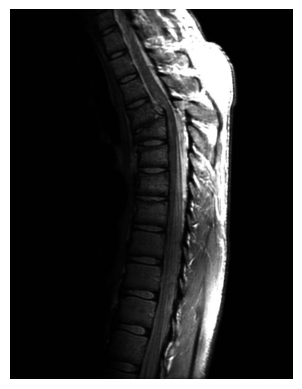

In [22]:
img_preto = plt.imread('./preto.jpeg')
#display the image
plt.imshow(img_preto)
plt.axis('off')
plt.show()

In [23]:
def AjustConstrast(img):
  out = img.astype(np.float32)  # Convert to float for precision
  out = 256.0 / np.log(256.0) * np.log(1.0 + out)
  return out.astype(np.uint8)  # Convert back to uint8

In [24]:
def AjustConstrast2(img):
  out = img.astype(np.float64)  # Convert to float for precision
  out = np.exp(out) ** (np.log(256.0) / 256.0) - 1.0
  return out.astype(np.uint8)  # Convert back to uint8

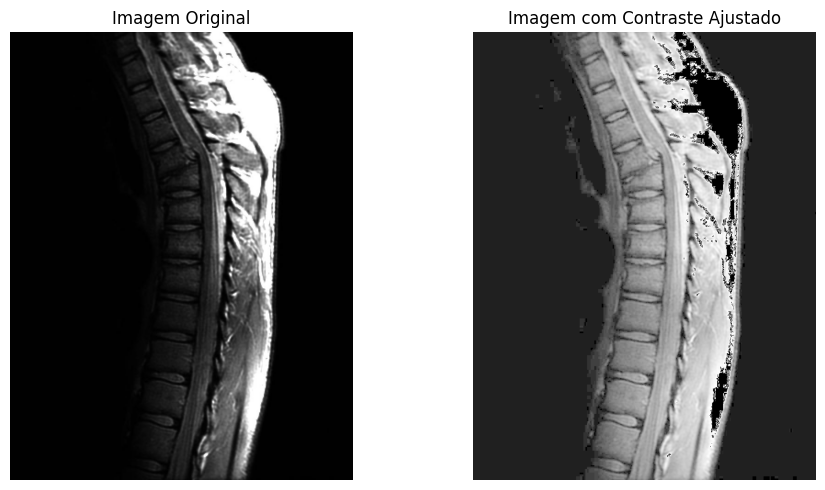

In [25]:
img_contrast = AjustConstrast(img_preto)
# Display the image
fig , ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(img_preto)
ax[0].set_title('Imagem Original')    
ax[0].axis('off')
ax[1].imshow(img_contrast)
ax[1].set_title('Imagem com Contraste Ajustado')
ax[1].axis('off')
plt.tight_layout()
plt.show()  


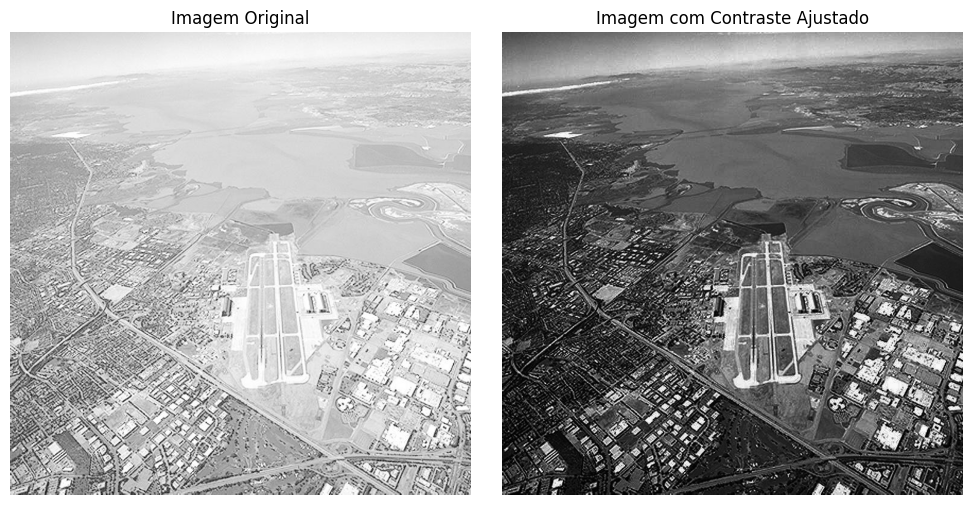

In [26]:
img_preto = plt.imread('./wash.jpeg')

img_contrast = AjustConstrast2(img_preto)
# Display the image
fig , ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(img_preto)
ax[0].set_title('Imagem Original')    
ax[0].axis('off')
ax[1].imshow(img_contrast)
ax[1].set_title('Imagem com Contraste Ajustado')
ax[1].axis('off')
plt.tight_layout()
plt.show()  

# Gama manipulation

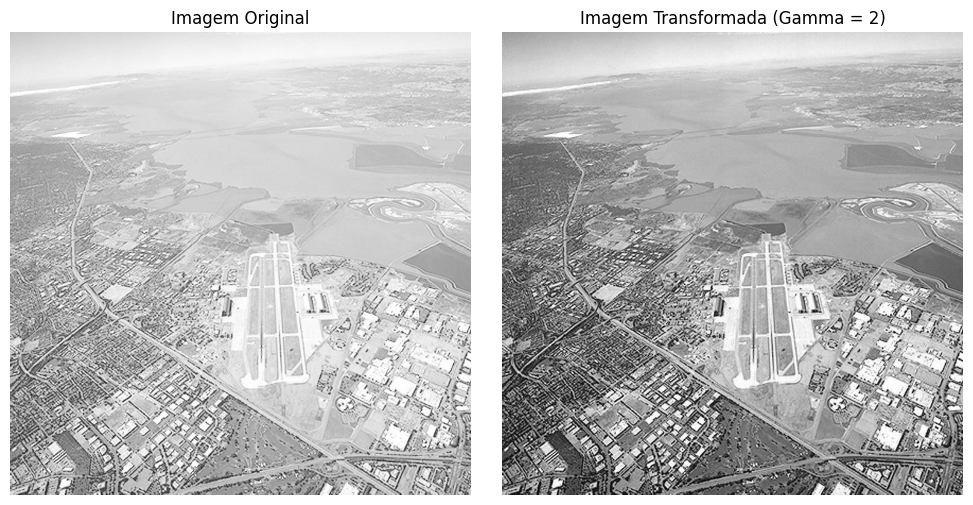

In [ ]:
def gamma_transform(image, gamma):
    c = 255.0 / 255.0 ** gamma
    img_gamma = c * (image.astype(np.float32)) ** gamma
    return img_gamma.astype(np.uint8)

# Load an example image
image = plt.imread('wash.jpeg')
# Apply gamma transformation
gamma_value = 2
transformed_image = gamma_transform(image, gamma_value)
# Display the original and transformed images
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(image)
ax[0].set_title('Imagem Original')  
ax[0].axis('off')
ax[1].imshow(transformed_image)
ax[1].set_title(f'Imagem Transformada (Gamma = {gamma_value})')   
ax[1].axis('off')
plt.tight_layout()
plt.show()  

# Limiarização


In [41]:
def limiarization(image, threshold):
    img_th = np.zeros(image.shape, dtype=np.uint8)
    img_th[image > threshold] = 255
    return img_th

In [45]:
def limiarization2(image, a,b):
    img_th = np.zeros(image.shape, dtype=np.uint8)
    img_th[(image>a) & (image<b)] = 255
    return img_th

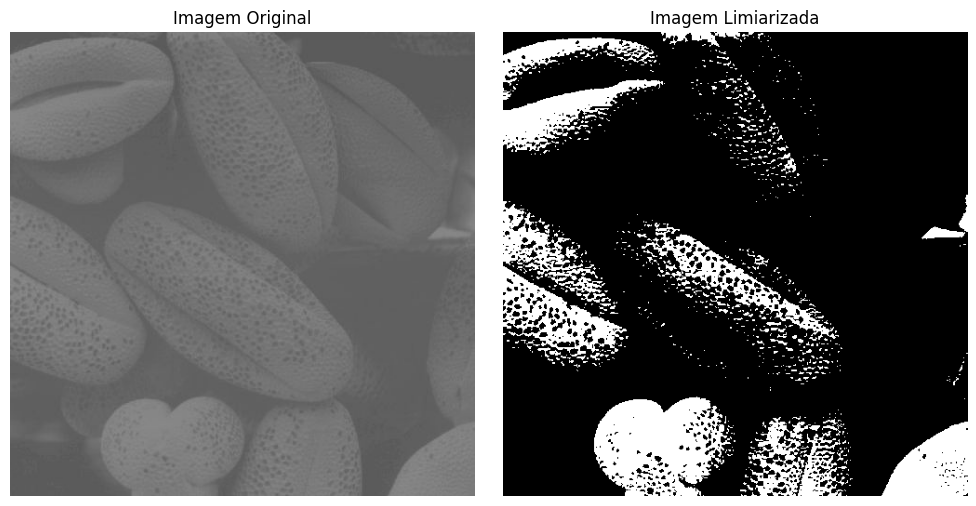

In [48]:
img_feijao = plt.imread('parece_feijao.jpeg')
img_limi = limiarization2(img_feijao, 120,180)

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(img_feijao)
ax[0].set_title('Imagem Original')  
ax[0].axis('off')
ax[1].imshow(img_limi)
ax[1].set_title('Imagem Limiarizada')
ax[1].axis('off')
plt.tight_layout()
plt.show()


# Histogramas

